# Import dependencies

In [1]:
!pip install keras

In [2]:
!pip install cython

In [3]:
import sys
sys.path.append('Mask_RCNN')

In [4]:
import os
import sys
import random
import math
import re
import time

import tensorflow as tf
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.InteractiveSession(config=config)
#sess = tf.Session(config=config)

from keras import backend as K
K.set_session(sess)

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import csv
import imageio
import skimage
from config import Config
from skimage.morphology import label
from skimage.feature import canny
from skimage import exposure
from keras.callbacks import Callback
from skimage.morphology import binary_closing, binary_opening, disk, binary_dilation
from scipy.ndimage.morphology import binary_fill_holes
from sklearn.externals import joblib
from skimage.transform import PiecewiseAffineTransform, warp
from skimage.morphology import watershed
from skimage.filters import sobel
from preparation import vgg_feature_extractor
from random import *

import gc; gc.enable()
import utils
import model as modellib
import visualize
from model import log

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Let's download the mask_rcnn trained on COCO dataset to initialize the model.

In [5]:
pd.options.display.max_rows=100

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

We will now define the monitor that will help keep track on the training process.
With this you will be able to see your charts in the `charts` tab

Now we will load the metadata and divide them in train and valid splits

In [6]:
TRAIN_PATH = '../stage1_train'
TEST_PATH = '../stage1_test'
META_DATA_PATH = '../stage1_metadata.csv'
BG_DATA_PATH = '../stage1_backgroud_foreground_classes.csv'

In [7]:
if not os.path.exists(META_DATA_PATH):
    print('Generating stage1_metadata.csv')
    
    stage1_metadata = pd.DataFrame()
    
    train_image_ids = os.listdir(TRAIN_PATH) # ImageId
    train_is_train = [1] * len(train_image_ids)
    
    train_file_path = []
    for p in train_image_ids:
        if p[:4] == 'TCGA':
            train_file_path.append(TRAIN_PATH + '/' + p + '/images/' + p + '.tif')
        else:
            train_file_path.append(TRAIN_PATH + '/' + p + '/images/' + p + '.png')
    
    test_image_ids = os.listdir(TEST_PATH) # ImageId
    test_is_train = [0] * len(test_image_ids)
    test_file_path = [TEST_PATH + '/' + p + '/images/' + p + '.png' for p in test_image_ids]
    
    stage1_metadata['ImageId'] = np.concatenate([train_image_ids, test_image_ids], axis=0)
    stage1_metadata['is_train'] = np.concatenate([train_is_train, test_is_train], axis=0)
    stage1_metadata['file_path_image'] = np.concatenate([train_file_path, test_file_path], axis=0)
    
    ve = vgg_feature_extractor(n_clusters=10)
    train_vgg_features_clusters = ve.get_vgg_clusters(stage1_metadata[stage1_metadata.is_train == 1].reset_index(drop=True), is_train=True)
    test_vgg_features_clusters =ve.get_vgg_clusters(stage1_metadata[stage1_metadata.is_train == 0].reset_index(drop=True), is_train=False)
    
    stage1_metadata['vgg_features_clusters'] = np.concatenate([train_vgg_features_clusters, test_vgg_features_clusters], axis=0)
    
    stage1_metadata.to_csv(META_DATA_PATH, index=False)
    meta = stage1_metadata
    
    del vgg_feature_extractor; gc.collect()
else:
    meta = pd.read_csv(META_DATA_PATH)
    

meta.head(100)

,ImageId,is_train,file_path_image,vgg_features_clusters
0,ef6634efb46567d87b811be786b18c4cd0e2cda23d79b6...,1,../stage1_train/ef6634efb46567d87b811be786b18c...,1
1,351771edfc5db5665ded8aa4940257276b6526663c76e3...,1,../stage1_train/351771edfc5db5665ded8aa4940257...,6
2,785555c0cbb49dad835635217085287a8cc61c27d26f0e...,1,../stage1_train/785555c0cbb49dad83563521708528...,4
3,7ba20aa731cc21af74a8d940254176cbad1bdc44f240b5...,1,../stage1_train/7ba20aa731cc21af74a8d940254176...,1
4,43cf6b2ec0b0745ac2b87b4d8780f62e9050d3f5d50a1f...,1,../stage1_train/43cf6b2ec0b0745ac2b87b4d8780f6...,3
5,0b2e702f90aee4fff2bc6e4326308d50cf04701082e718...,1,../stage1_train/0b2e702f90aee4fff2bc6e4326308d...,4
6,61dc249314d7b965eb4561ec739eab9b0f60af55c97b25...,1,../stage1_train/61dc249314d7b965eb4561ec739eab...,6
7,28d33efef218392e79e385906deb88055d94b65ad217de...,1,../stage1_train/28d33efef218392e79e385906deb88...,0
8,4596961c789d3b41916492918797724fe75128239fefc5...,1,../stage1_train/4596961c789d3b4191649291879772...,6
9,1ec74a26e772966df764e063f1391109a60d803cff9d15...,1,../stage1_train/1ec74a26e772966df764e063f13911...,9


In [8]:
back_ground_df = pd.read_csv(BG_DATA_PATH)
back_ground_df.tail(100)

,filename,foreground,background
665,589f86dee5b480a88dd4f77eeaffe2c4d70aefdf879a40...,purple,purple
666,442c4eb0185698fe7d148c108a46f74abd399aecda2f4f...,purple,purple
667,709e094e39629a9ca21e187f007b331074694e443db402...,purple,purple
668,6b0ac2ab04c09dced54058ec504a4947f8ecd5727dfca7...,purple,purple
669,87ea72894f6534b28e740cc34cf5c9eb75d0d8902687fc...,purple,purple
670,b0e35e06b85da49bfe3ea737711a72b551a6add446e30e...,purple,purple
671,f952cc65376009cfad8249e53b9b2c0daaa3553e897096...,purple,purple
672,6d327ab4f0e3604fa6e9b8041c7e6db86ab809890d886c...,purple,purple
673,e49fc2b4f1f39d481a6525225ab3f688be5c87f5688445...,purple,purple
674,a90401357d50e1376354ae6e5f56a2e4dff3fdb5a4e8d5...,purple,purple


In [9]:
back_ground_df['ImageId'] = [fn.replace('.png', '') if fn[-4:] == '.png' else fn.replace('.tif', '') for fn in back_ground_df.filename]
print('Image ID in background data counts:\n', meta.ImageId.isin(back_ground_df.ImageId).value_counts())

Image ID in background data counts:
 True    759
Name: ImageId, dtype: int64


In [10]:
back_ground_df.background.value_counts()

black     599
purple    101
white      57
yellow      8
Name: background, dtype: int64

In [11]:
back_ground_df.foreground.value_counts()

white     599
purple    150
black      16
Name: foreground, dtype: int64

In [12]:
back_ground_df['composed_bf_ground'] = back_ground_df.background.astype(str) + '_' + back_ground_df.foreground.astype(str)
back_ground_df.composed_bf_ground.value_counts()

black_white      599
purple_purple    101
white_purple      41
white_black       16
yellow_purple      8
Name: composed_bf_ground, dtype: int64

### How to deal with it:
1. yellow_purple, white_black -> reverse to black_white
2. white_purple, purple_purple -> change to white black. (the foreground seems darker in these cases)
3. Separate into two groups: 1. + 2.

In [13]:
back_ground_df = back_ground_df.set_index('ImageId')
back_ground_df.head(10)

,filename,foreground,background,composed_bf_ground
ImageId,,,,
d32ea6d318626ca14a967d0c1ad3218aebfe636624a8d1173f5150dde8ff38cf,d32ea6d318626ca14a967d0c1ad3218aebfe636624a8d1...,white,black,black_white
4596961c789d3b41916492918797724fe75128239fefc516c3ee75322b7926f0,4596961c789d3b41916492918797724fe75128239fefc5...,white,black,black_white
b6edad733399c83c8eb7a59c0d37b54e10cc0d59894e39ff843884d84f61dee1,b6edad733399c83c8eb7a59c0d37b54e10cc0d59894e39...,white,black,black_white
831218e6a1a54b23d4be56c5799854e7eb978811b89215319dc138900bd563e6,831218e6a1a54b23d4be56c5799854e7eb978811b89215...,white,black,black_white
b1e3aeb0c56261c17eb71c747d116057b8da7e8c8a6845bdc01b2b3ee2299229,b1e3aeb0c56261c17eb71c747d116057b8da7e8c8a6845...,white,black,black_white
4a424e0cb845cf6fd4d9fe62875552c7b89a4e0276cf16ebf46babe4656a794e,4a424e0cb845cf6fd4d9fe62875552c7b89a4e0276cf16...,white,black,black_white
43cf6b2ec0b0745ac2b87b4d8780f62e9050d3f5d50a1fcefa42d166191e84c6,43cf6b2ec0b0745ac2b87b4d8780f62e9050d3f5d50a1f...,white,black,black_white
f487cc82271cf84b4414552aa8b0a9d82d902451ebe8e8bc639d4121c1672ff7,f487cc82271cf84b4414552aa8b0a9d82d902451ebe8e8...,white,black,black_white
bf7691b0a79811fa068b7408cbce636a73f01ef9e971a95da1a2d96df73782b6,bf7691b0a79811fa068b7408cbce636a73f01ef9e971a9...,white,black,black_white


In [14]:
meta['bg_type'] = meta.ImageId.map(back_ground_df.composed_bf_ground)
meta['bg_type'].value_counts()

black_white      594
purple_purple    100
white_purple      41
white_black       16
yellow_purple      8
Name: bg_type, dtype: int64

In [15]:
meta[meta['is_train']==1].bg_type.value_counts()

black_white      541
purple_purple     99
white_purple      38
white_black       16
Name: bg_type, dtype: int64

In [16]:
meta[meta['is_train']==0].bg_type.value_counts()

black_white      53
yellow_purple     8
white_purple      3
purple_purple     1
Name: bg_type, dtype: int64

In [17]:
meta['process_type'] = meta['bg_type'].map({
    'black_white': 2, # do nothing
    'white_black': 3, # pure reverse
    'purple_purple': 2, # do nothing
    'yellow_purple': 1, # turns into gray and reverse
    'white_purple': 2 # do nothing
})
meta['process_type'].value_counts()

2    735
3     16
1      8
Name: process_type, dtype: int64

In [18]:
meta['group'] = meta['bg_type'].map({
    'black_white': 0,
    'white_black': 0,
    'purple_purple': 1,
    'yellow_purple': 0,
    'white_purple': 1
})
meta['group'].value_counts()

0    618
1    141
Name: group, dtype: int64

In [19]:
def train_val_split(meta_train, val_size=0.1, random_state=719):
    meta_train_groups = [meta_train[meta_train['group'] == group].reset_index(drop=True) for group in range(2)]
    
    meta_train_val_groups = []
    
    for train_group in meta_train_groups:
        meta_train_val_groups
        
        val = train_group.sample(frac=val_size, random_state=random_state)
        tr = train_group[~train_group.index.isin(val.index)]
        
        meta_train_val_groups.append((tr, val))
    
    return meta_train_val_groups

def train_split(meta_train):
    meta_train_groups = [meta_train[meta_train['group'] == group].reset_index(drop=True) for group in range(2)]
    return meta_train_groups

In [20]:
IS_DEVELOP = False
if IS_DEVELOP:
    VAL_SIZE = .3
else:
    VAL_SIZE = 0.01

In [21]:
meta_train = meta[meta['is_train']==1]
meta_test = meta[meta['is_train']==0]
meta_train_val_groups = train_val_split(meta_train, val_size=VAL_SIZE, random_state=519)

for i in range(2):
    print(meta_train_val_groups[i][0].shape, meta_train_val_groups[i][1].shape)

(551, 7) (6, 7)
(136, 7) (1, 7)


# Mask-RCNN configuration
We will now define parameters for our mask-rcnn. 
Tweak them to get better results!

In [22]:
class DsbConfig(Config):

    # Give the configuration a recognizable name
    NAME = "dsb"
      
    LEARNING_RATE = 1e-2
    
    # If enabled, resizes instance masks to a smaller size to reduce
    # memory load. Recommended when using high-resolution image
    USE_MINI_MASK = True
    MINI_MASK_SHAPE = (56, 56)  # (height, width) of the mini-mask
    
    # Train on 1 GPU and 8 images per GPU. Batch size is GPUs * images/GPU.
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2
    # Total number of steps (batches of samples) to yield from generator before declaring one epoch finished and starting the next epoch.
    # typically be equal to the number of samples of your dataset divided by the batch size
    STEPS_PER_EPOCH = 300
    VALIDATION_STEPS = 70

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + nucleis
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    IMAGE_PADDING = True  # currently, the False option is not supported
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels, maybe add a 256?
    # The strides of each layer of the FPN Pyramid. These values
    # are based on a Resnet101 backbone.
    BACKBONE_STRIDES = [4, 8, 16, 32, 64]
    # How many anchors per image to use for RPN training
    RPN_TRAIN_ANCHORS_PER_IMAGE = 320 #300
    
    # ROIs kept after non-maximum supression (training and inference)
    POST_NMS_ROIS_TRAINING = 2000
    POST_NMS_ROIS_INFERENCE = 2000
    POOL_SIZE = 7
    MASK_POOL_SIZE = 14 # 14
    MASK_SHAPE = [28, 28] # 28
    TRAIN_ROIS_PER_IMAGE = 512
    RPN_DETECTION_MIN_CONFIDENCE = .6
    RPN_NMS_THRESHOLD = 0.6 #0.7
    MAX_GT_INSTANCES = 256
    DETECTION_MAX_INSTANCES = 450 
    # Minimum probability value to accept a detected instance
    # ROIs below this threshold are skipped
    DETECTION_MIN_CONFIDENCE = 0.67 # may be smaller?
    # Non-maximum suppression threshold for detection
    DETECTION_NMS_THRESHOLD = 0.3 # 0.3
    
    # DETECTION_MAX_INSTANCES=400, DETECTION_MIN_CONFIDENCE=.7 => Val loss: .21xx, LB: .424
    # DETECTION_MAX_INSTANCES=450, DETECTION_MIN_CONFIDENCE=.65 => Val loss: .3, LB: .438
    # DETECTION_MAX_INSTANCES=, DETECTION_MIN_CONFIDENCE= => Val loss: ., LB: .
    
    '''
    0324 note: 
        RPN_NMS_THRESHOLD .7 -> .6 to generate more proposals at training,
        DETECTION_MAX_INSTANCES 400 -> 450
        DETECTION_MIN_CONFIDENCE .7
        BACKBONE_STRIDES add `2` ..?
    '''
    
    MEAN_PIXEL = np.array([0.,0.,0.])
    
    # Weight decay regularization
    WEIGHT_DECAY = 0.0001
    
    # Min Box Size
    MIN_BOX_SIZE = 36./(512.**2.) # (36/512**2) (delete objects smaller than 6*6 pixels)
    BORDER_RATIO = 4. / 512. # smaller than 4 pixels width\height at the border
    BORDER_MIN_BOX_SIZE = 16./(512.**2.)
  
    LR_SHRINK_PERIOD = 10
    
config = DsbConfig()

# Agument functions

In [23]:
class Agg_Func():
    def __init__(self, funcs=[]):
        self.funcs = funcs
        
    def __call__(self, x):
        res = x
        for f in self.funcs:
            res = f(res)
        return res

In [24]:
class Augment():
    def __init__(self, rotate=True, flip=True):
        self.augment_funcs = []
        
        if flip:   
            self.augment_funcs.extend([
                Agg_Func(funcs=[]),
                Agg_Func(funcs=[np.fliplr]),
                Agg_Func(funcs=[np.flipud]),
                Agg_Func(funcs=[np.fliplr, np.flipud]),
            ])
            
            if rotate:
                self.augment_funcs.extend([
                    Agg_Func(funcs=[np.rot90]),
                    Agg_Func(funcs=[np.rot90, np.fliplr]),
                    Agg_Func(funcs=[np.rot90, np.flipud]),
                    Agg_Func(funcs=[np.rot90, np.fliplr, np.flipud]),
                ])
        elif rotate:
            self.augment_funcs.extend([
                Agg_Func(funcs=[]),
                Agg_Func(funcs=[np.rot90]),
            ])
    
    def get_random_augement(self):
        index = randrange(len(self.augment_funcs))
        return self.augment_funcs[index]
    
    def apply_all_augment(self, img):
        res = []
        for f in self.augment_funcs:
            res.append(f(img))
        return res

# Dataset definition

We need to define our datasets for the data science bowl competition

In [25]:
class DsbDataset(utils.Dataset):

    '''
    process_info is a image-id <=> process type mapping pd.series
    '''
    def load_dataset(self, process_info, train_mode=True, augment=False):
        self.add_class("dsb", 1, "nuclei")
        self.process_info = process_info
        self.augmenter = Augment()
        self.augment = augment
        
        if train_mode:
            directory = dsb_dir
        else:
            directory = test_dir
            
        ids = []
        for i, id in enumerate(process_info.ImageId.values):
            image_dir = os.path.join(directory, id)
            self.add_image("dsb", image_id=i, path=image_dir)
            ids.append(i)
        
        self.process_info.reset_index(drop=True, inplace=True)
        #print(self.process_info)
        self.process_info['id'] = ids
        self.process_info.set_index('id')
        self.process_info = self.process_info['process_type']
        #print(self.process_info)
        
    def load_image(self, image_id, non_zero=None):
        info = self.image_info[image_id]
        path = info['path']
        image_name = os.listdir(os.path.join(path, 'images'))
        image_path = os.path.join(path, 'images', image_name[0])
        image = imageio.imread(image_path)
        
        #print(self.process_info[image_id])
        if image_path[-4:] == '.tif':
            self.offset = (randrange(488), randrange(488))
            image = image[self.offset[0]:self.offset[0]+512, self.offset[1]:self.offset[1]+512, :]
            #image = skimage.transform.resize(image, (512,512),  preserve_range=True)
        
        if image.shape[2] != 3:
            image = image[:,:,:3]

        image = self.preprocess(image, process_type=self.process_info[image_id])
        image = image.astype('float32')
        
        if self.augment:
            self.augment_func = self.augmenter.get_random_augement()
            image = self.augment_func(image)
            
        return image

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        if info["source"] == "shapes":
            return info["shapes"]
        else:
            super(self.__class__).image_reference(self, image_id)

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        path = info['path']
        mask_dir = os.path.join(path, 'masks')
        mask_names = os.listdir(mask_dir)
        count = len(mask_names)
        mask = []
        
        for i, el in enumerate(mask_names):
            msk_path = os.path.join(mask_dir, el)
            msk = imageio.imread(msk_path)
            if np.sum(msk) == 0:
                print('invalid mask')
                continue
                
            if 'TCGA' in mask_dir:
                #msk = skimage.transform.resize(msk, (512,512), preserve_range=True)
                msk = msk[self.offset[0]:self.offset[0]+512, self.offset[1]:self.offset[1]+512]
                if np.sum(msk) == 0:
                    continue
                
            msk = msk.astype('float32')/255.
            
            if len(msk.shape) > 2:
                msk = np.sum(msk, axis=2)
                
            mask.append(msk)
            
        try:
            mask = np.array(mask)
        except:
            for i, m in enumerate(mask):
                if len(m.shape) > 2:
                    print(mask_names[i])
                    
        mask[mask > 0.] = 1.
        mask = np.transpose(mask, (1,2,0))
        if self.augment:
            mask = self.augment_func(mask) # self.augment_func was decided when loading image before loading masks
            
        occlusion = np.logical_not(mask[:, :, -1]).astype(np.uint8)
        count = mask.shape[2]
        for i in range(count-2, -1, -1):
            mask[:, :, i] = mask[:, :, i] * occlusion
            occlusion = np.logical_and(occlusion, np.logical_not(mask[:, :, i]))
        class_ids = [self.class_names.index('nuclei') for s in range(count)]
        class_ids = np.asarray(class_ids)
        
        return mask, class_ids.astype(np.int32)
    
    def preprocess(self, img, process_type=0):
        
        if process_type == 0: # grey-rgb-grey
            gray = skimage.color.rgb2gray(img.astype('uint8'))
            img = skimage.color.gray2rgb(gray)
            img *= 255.
        elif process_type == 1:  # grey-rgb-grey-reverse
            gray = skimage.color.rgb2gray(img.astype('uint8'))
            img = skimage.color.gray2rgb(gray)
            img *= 255.
            img = 255. - img
        elif process_type == 2:
            pass # do nothing
        elif process_type == 3:
            img = 255. - img
        
        return img

In [26]:
dsb_dir = TRAIN_PATH
test_dir = TEST_PATH

In [27]:
'''
for i in range(2):
    print(meta_train_val_groups[i][0].shape, meta_train_val_groups[i][1].shape)
'''

datasets = []
for i in range(2):
    
    tr, val = meta_train_val_groups[i]

    # Training dataset
    dataset_train = DsbDataset()
    dataset_train.load_dataset(tr[['ImageId', 'process_type']], augment=True)
    dataset_train.prepare()

    # Validation dataset
    dataset_val = DsbDataset()
    dataset_val.load_dataset(val[['ImageId', 'process_type']])
    dataset_val.prepare()
    
    datasets.append((dataset_train, dataset_val))

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Let's take a look at some images

Loading group= 0
image shape= (1024, 1024, 3) mask shape= (1024, 1024, 94) bg type= white_black process type= 3


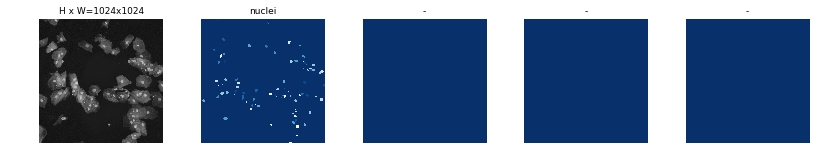

image shape= (360, 360, 3) mask shape= (360, 360, 16) bg type= black_white process type= 2


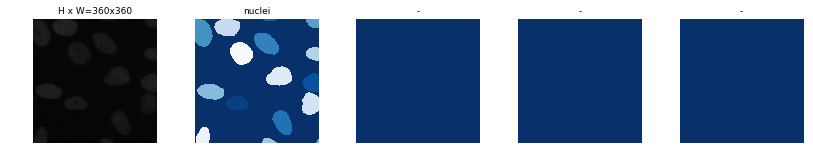

image shape= (360, 360, 3) mask shape= (360, 360, 20) bg type= black_white process type= 2


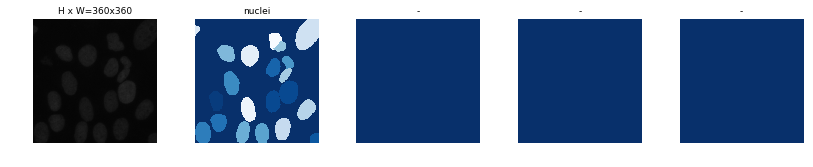

image shape= (256, 256, 3) mask shape= (256, 256, 38) bg type= black_white process type= 2


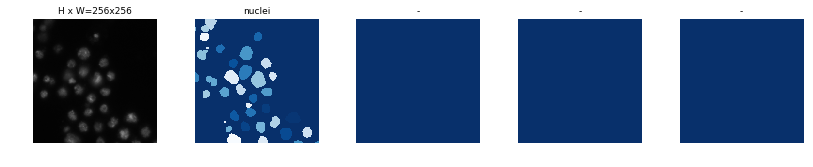

image shape= (520, 696, 3) mask shape= (520, 696, 70) bg type= black_white process type= 2


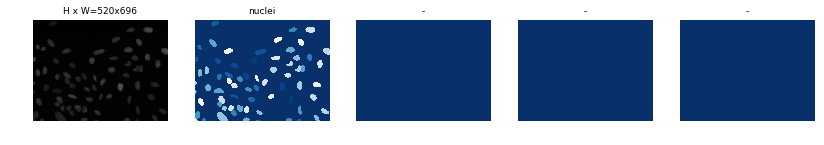

image shape= (360, 360, 3) mask shape= (360, 360, 43) bg type= black_white process type= 2


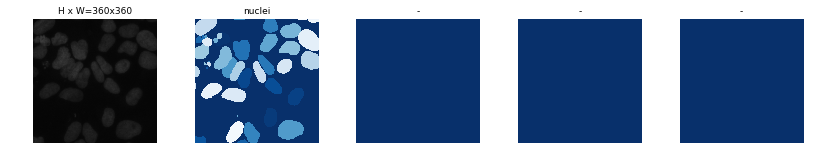

image shape= (256, 256, 3) mask shape= (256, 256, 50) bg type= black_white process type= 2


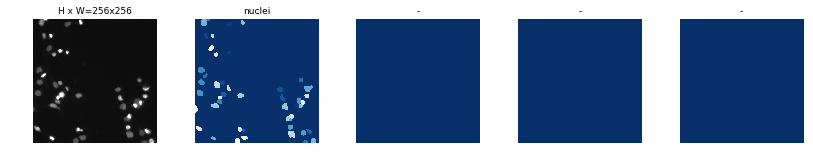

image shape= (256, 256, 3) mask shape= (256, 256, 55) bg type= black_white process type= 2


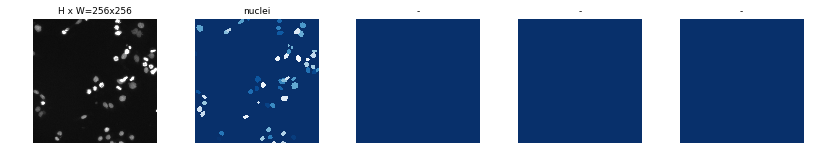

image shape= (256, 256, 3) mask shape= (256, 256, 9) bg type= black_white process type= 2


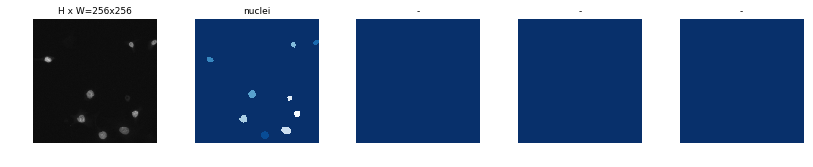

image shape= (256, 256, 3) mask shape= (256, 256, 8) bg type= black_white process type= 2


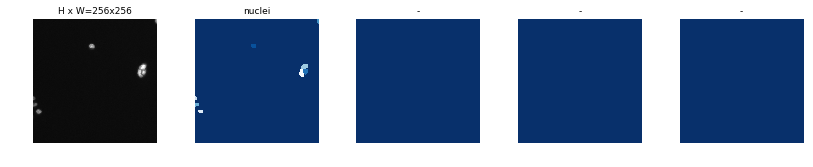

Loading group= 1
image shape= (320, 256, 3) mask shape= (320, 256, 23) bg type= purple_purple process type= 2


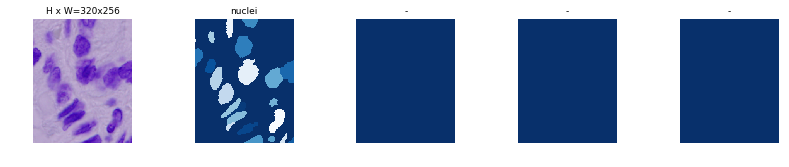

image shape= (256, 320, 3) mask shape= (256, 320, 61) bg type= white_purple process type= 2


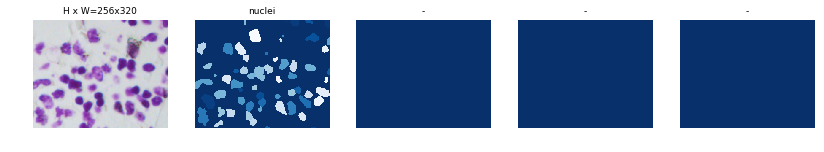

image shape= (320, 256, 3) mask shape= (320, 256, 84) bg type= purple_purple process type= 2


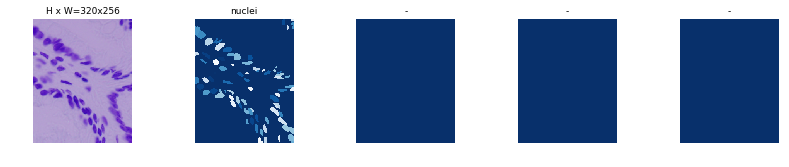

image shape= (256, 320, 3) mask shape= (256, 320, 27) bg type= white_purple process type= 2


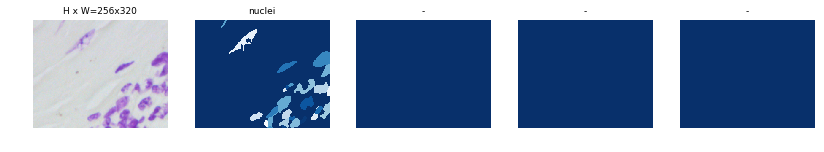

image shape= (320, 256, 3) mask shape= (320, 256, 9) bg type= purple_purple process type= 2


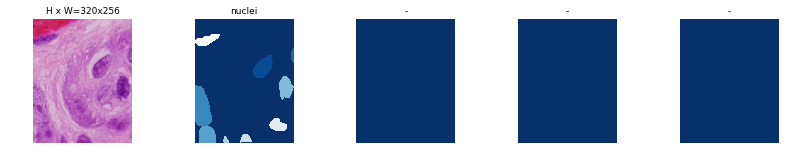

image shape= (320, 256, 3) mask shape= (320, 256, 9) bg type= white_purple process type= 2


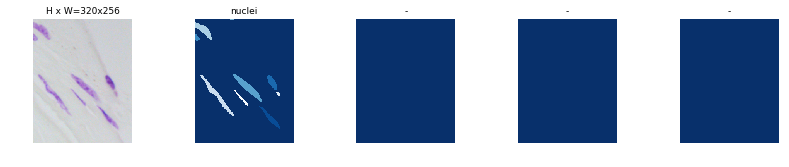

image shape= (256, 320, 3) mask shape= (256, 320, 83) bg type= purple_purple process type= 2


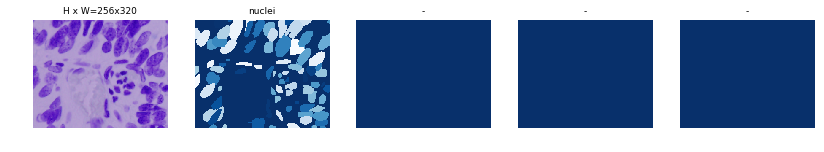

image shape= (256, 320, 3) mask shape= (256, 320, 19) bg type= purple_purple process type= 2


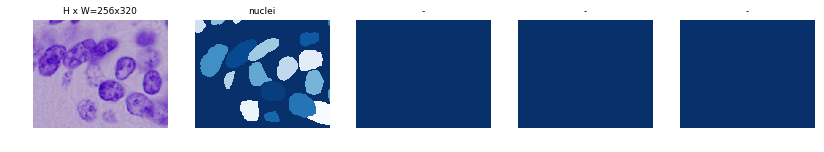

image shape= (256, 320, 3) mask shape= (256, 320, 26) bg type= purple_purple process type= 2


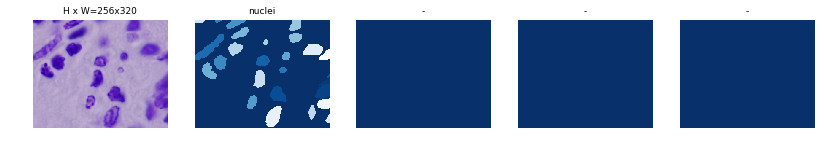

image shape= (320, 256, 3) mask shape= (320, 256, 64) bg type= white_purple process type= 2


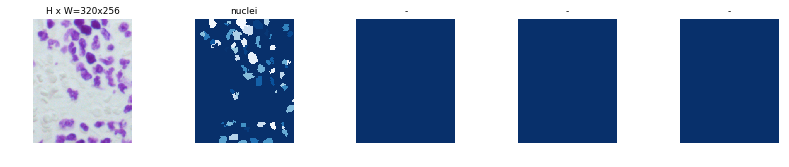

In [28]:
for i in range(2):    
    dataset_train, _ = datasets[i]
    
    #image_ids = dataset_train.image_ids
    image_ids = np.random.choice(dataset_train.image_ids, 10)
    print('Loading group=',i)
    for image_id in image_ids:
        image = dataset_train.load_image(image_id)

        mask, class_ids = dataset_train.load_mask(image_id)
        
        print('image shape=', image.shape, 'mask shape=', mask.shape, 
              'bg type=', meta_train_val_groups[i][0].bg_type.values[image_id],
              'process type=', meta_train_val_groups[i][0].process_type.values[image_id])
        visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)

# Model Training

OK! 

I think we are ready to do some training!
We will instantiate the model and initialize it with COCO weights

In [ ]:
if IS_DEVELOP:
    epochs = [10, 10]
    lr_shrink_period = [5, 5]
    inital_lr = 0.01
else:
    epochs = [120, 120]
    lr_shrink_period = [90, 90]
    inital_lr = 0.001
    
for i in range(2):
    train_index = i
    
    dataset_train, dataset_val = datasets[train_index]
    
    config.LEARNING_RATE = inital_lr
    config.LR_SHRINK_PERIOD = lr_shrink_period[train_index]
    config.STEPS_PER_EPOCH = len(dataset_train.image_ids) // config.IMAGES_PER_GPU
    
    model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)
    
    init_with = "coco"  # imagenet, coco, or last

    if init_with == "imagenet":
        model.load_weights(model.get_imagenet_weights(), by_name=True)
    elif init_with == "coco":
        # Load weights trained on MS COCO, but skip layers that
        # are different due to the different number of classes
        # See README for instructions to download the COCO weights
        model.load_weights(COCO_MODEL_PATH, by_name=True,
                           exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                    "mrcnn_bbox", "mrcnn_mask"])
    elif init_with == "last":
        # Load the last model you trained and continue training
        model.load_weights(model.find_last()[1], by_name=True)
        
    model.train(dataset_train, dataset_val, 
                learning_rate=config.LEARNING_RATE,
                epochs=epochs[train_index], 
                layers="all", clbcks=[])

Instructions for updating:
Use the retry module or similar alternatives.

Starting at epoch 0. LR=0.001

Checkpoint Path: /data/khyeh/logs/dsb20180406T1135/mask_rcnn_dsb_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a       

/usr/local/lib/python3.5/dist-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)
/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/gradients_impl.py:100: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.5/dist-packages/keras/engine/training.py:2087: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 1/120

Epoch 00001: LearningRateScheduler reducing learning rate to 0.001.
 42/275 [===>..........................] - ETA: 10:29 - loss: 2.7560 - rpn_class_loss: 0.2921 - rpn_bbox_loss: 0.9833 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.6415 - mrcnn_mask_loss: 0.7602

Let's train and investigate the learning curves for all the mask-rcnn losses in the `charts` and `channels`

# Evaluate
I think we are ready to see how our model does on the validation!

In [29]:
class InferenceConfig(DsbConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # MEAN_PIXEL = np.array([56.02288505, 54.02376286, 54.26675248])

    DETECTION_MIN_CONFIDENCE = 0.88
    SNMS_METHOD = 2 # 0: normal greedy nms, 1: linear method 2: Gaussian method
    SNMS_SIGMA = 0.5

inference_config = InferenceConfig()

In [30]:
paths = ['logs/0331_gray_w_reverse/mask_rcnn_dsb_0050.h5',
         'logs/0331_color/mask_rcnn_dsb_0070.h5']

In [31]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

Loading weights from  logs/0331_color/mask_rcnn_dsb_0070.h5


/usr/local/lib/python3.5/dist-packages/scipy/ndimage/interpolation.py:616: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


original_image           shape: (512, 512, 3)         min:    0.00000  max:  254.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (84,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (84, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 84)        min:    0.00000  max:    1.00000


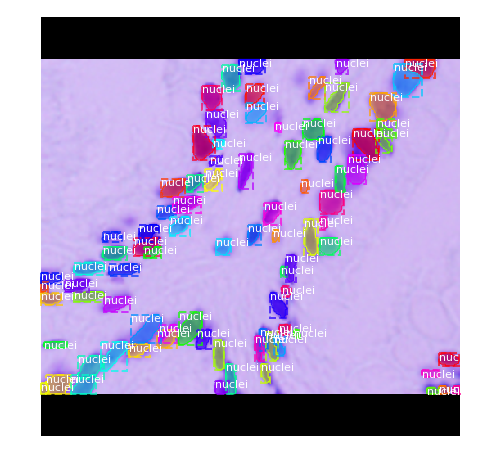

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  254.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  254.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


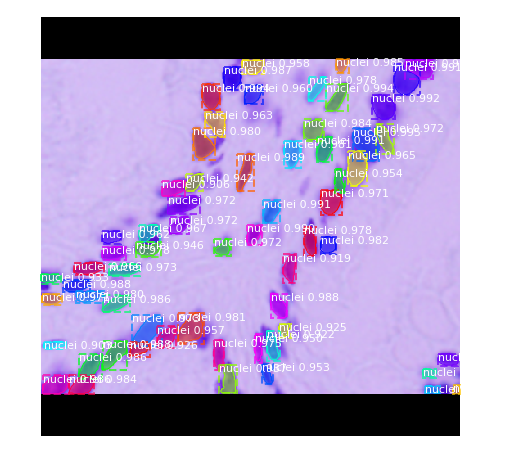

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (12,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (12, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 12)        min:    0.00000  max:    1.00000


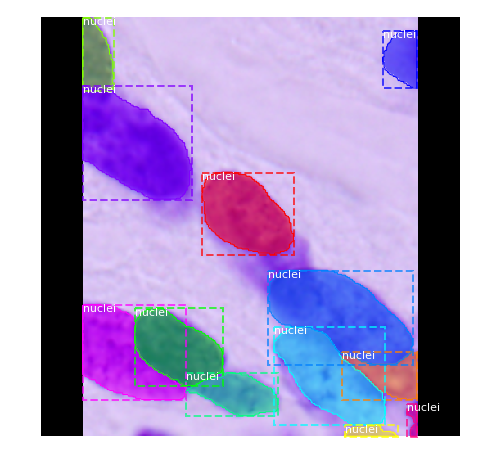

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


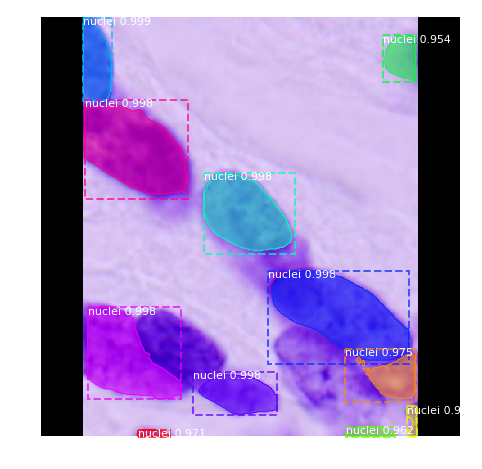

original_image           shape: (512, 512, 3)         min:   13.00000  max:  255.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (114,)                min:    1.00000  max:    1.00000
gt_bbox                  shape: (114, 4)              min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 114)       min:    0.00000  max:    1.00000


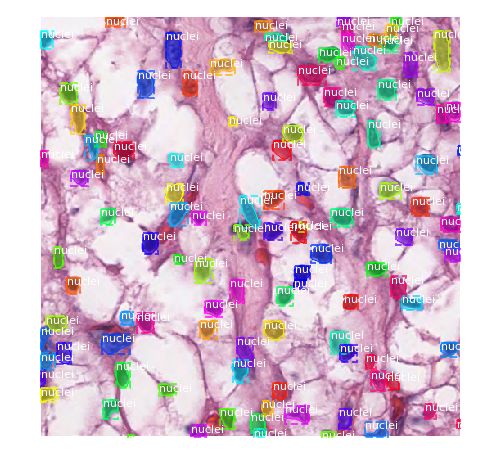

Processing 1 images
image                    shape: (512, 512, 3)         min:   13.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:   13.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


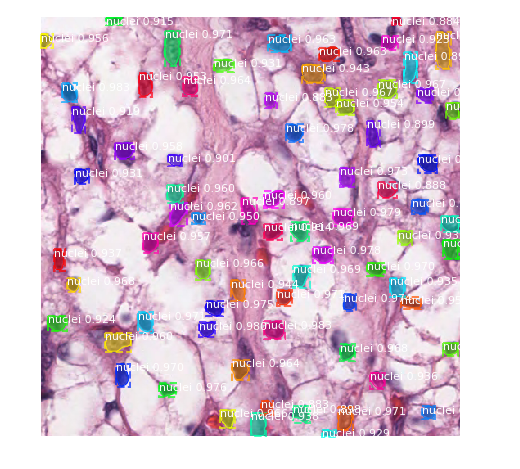

original_image           shape: (512, 512, 3)         min:    0.00000  max:  253.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (83,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (83, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 83)        min:    0.00000  max:    1.00000


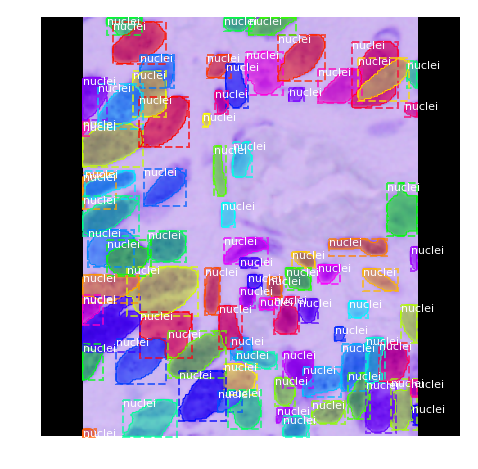

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  253.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  253.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


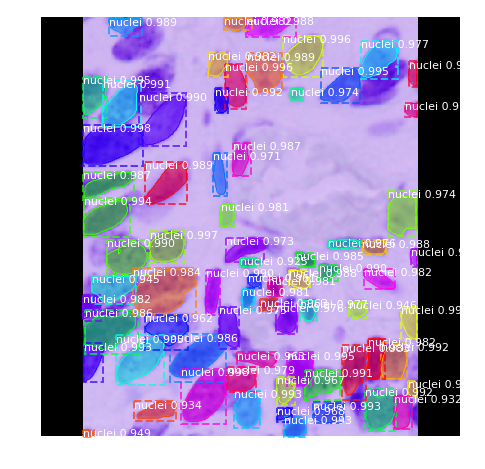

original_image           shape: (512, 512, 3)         min:    0.00000  max:  254.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (84,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (84, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 84)        min:    0.00000  max:    1.00000


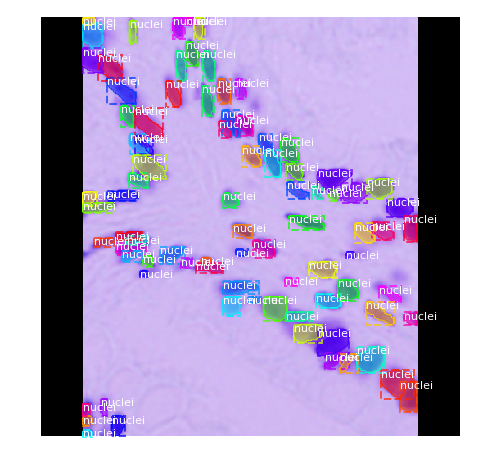

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  254.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  254.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


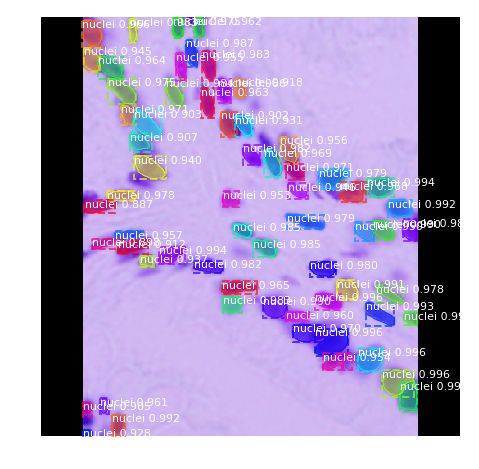

original_image           shape: (512, 512, 3)         min:    0.00000  max:  252.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (89,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (89, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 89)        min:    0.00000  max:    1.00000


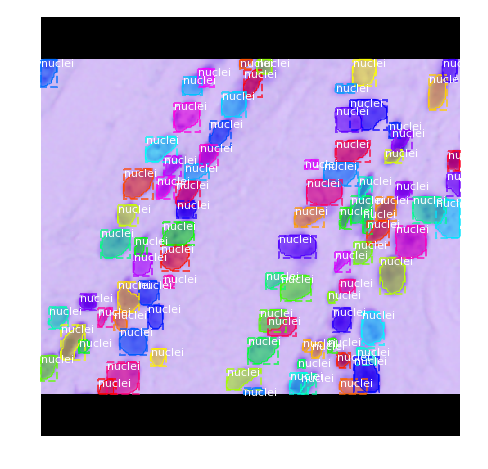

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  252.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  252.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


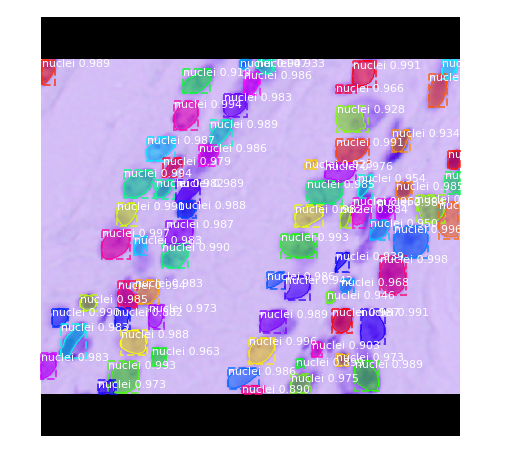

original_image           shape: (512, 512, 3)         min:    0.00000  max:  253.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (16,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (16, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 16)        min:    0.00000  max:    1.00000


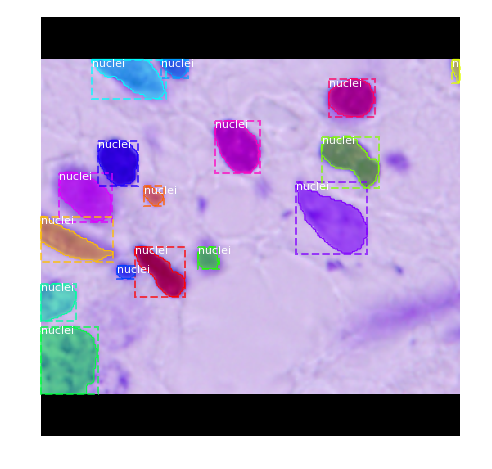

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  253.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  253.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


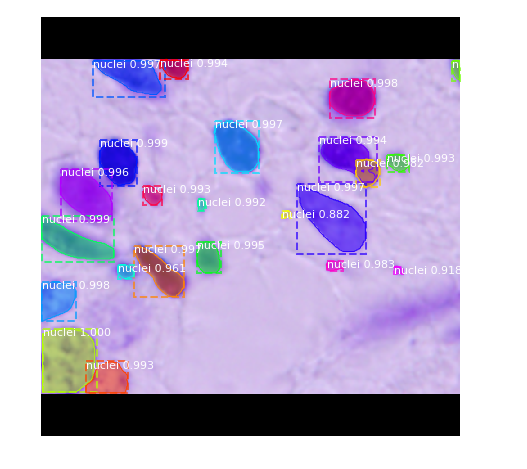

original_image           shape: (512, 512, 3)         min:   15.00000  max:  255.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (139,)                min:    1.00000  max:    1.00000
gt_bbox                  shape: (139, 4)              min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 139)       min:    0.00000  max:    1.00000


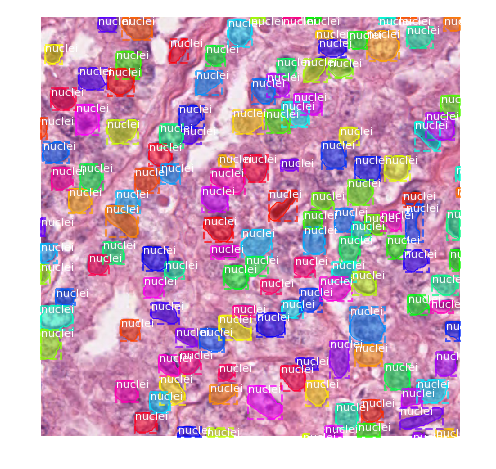

Processing 1 images
image                    shape: (512, 512, 3)         min:   15.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:   15.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


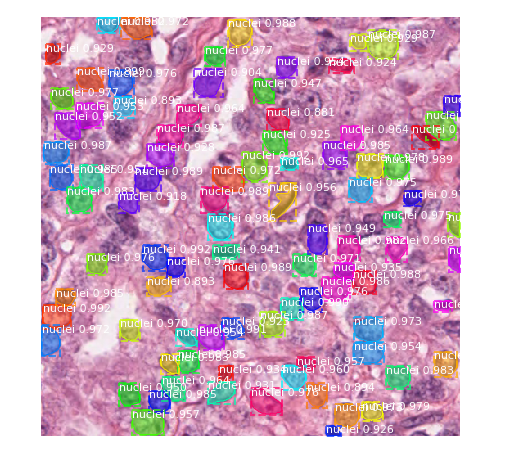

original_image           shape: (512, 512, 3)         min:    0.00000  max:  254.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (33,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (33, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 33)        min:    0.00000  max:    1.00000


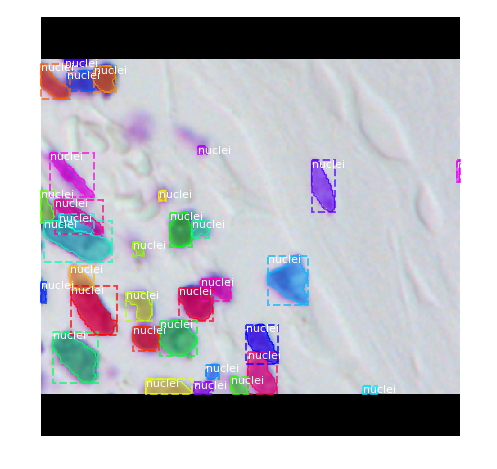

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  254.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  254.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


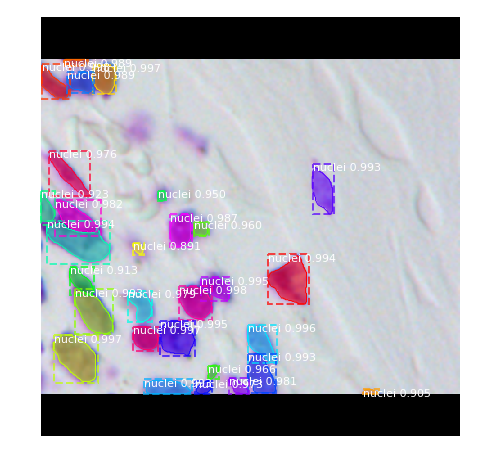

original_image           shape: (512, 512, 3)         min:    0.00000  max:  254.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (53,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (53, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 53)        min:    0.00000  max:    1.00000


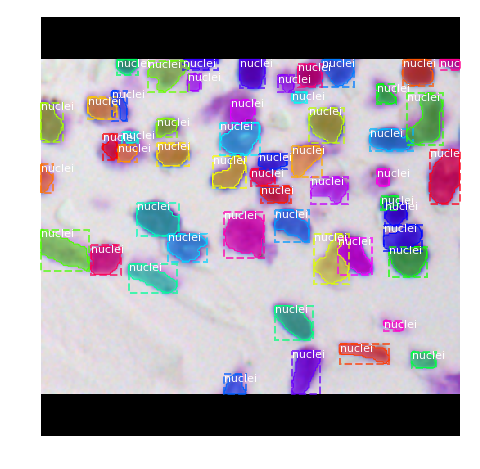

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  254.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  254.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


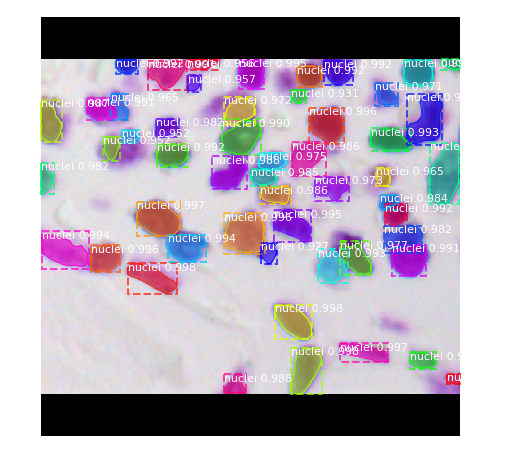

original_image           shape: (512, 512, 3)         min:    0.00000  max:  252.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (63,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (63, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 63)        min:    0.00000  max:    1.00000


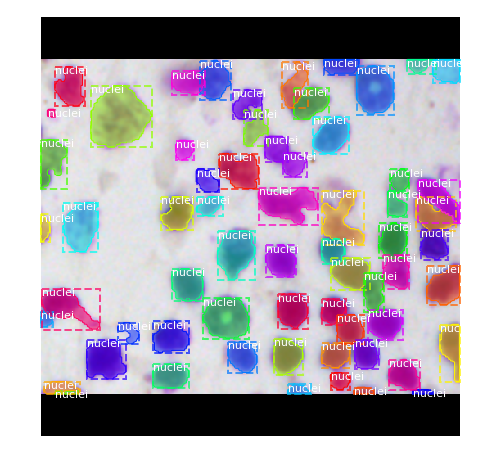

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  252.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  252.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


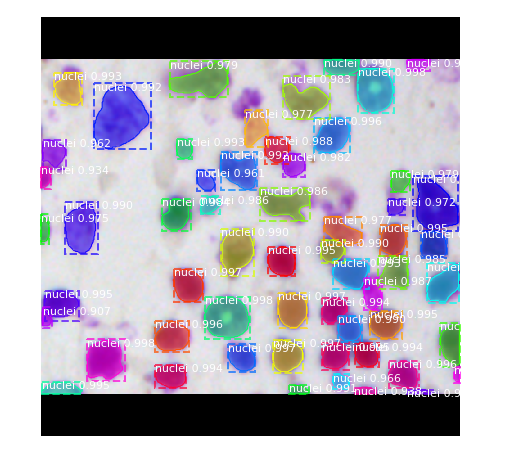

Loading weights from  logs/0331_gray_w_reverse/mask_rcnn_dsb_0050.h5
original_image           shape: (512, 512, 3)         min:    4.00000  max:  242.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (27,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (27, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 27)        min:    0.00000  max:    1.00000


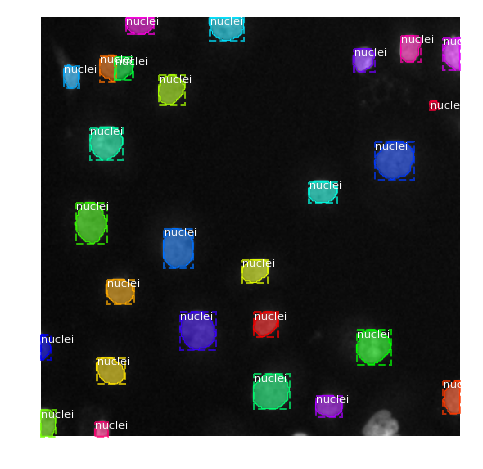

Processing 1 images
image                    shape: (512, 512, 3)         min:    4.00000  max:  242.00000
molded_images            shape: (1, 512, 512, 3)      min:    4.00000  max:  242.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


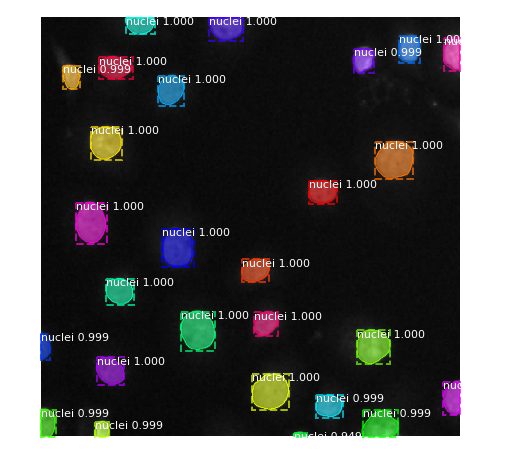

original_image           shape: (512, 512, 3)         min:    0.00000  max:  251.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (24,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (24, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 24)        min:    0.00000  max:    1.00000


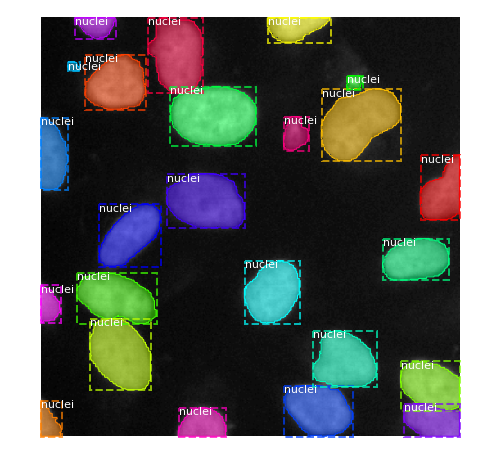

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  251.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  251.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


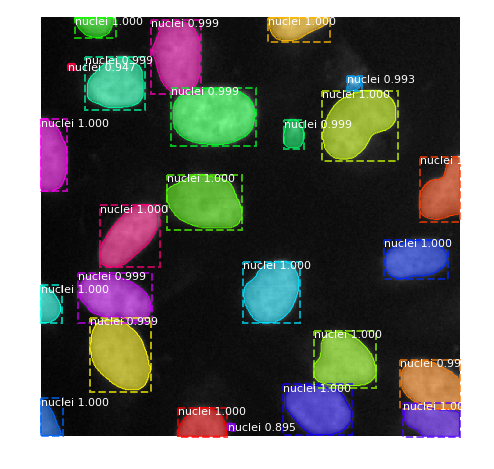

original_image           shape: (512, 512, 3)         min:    1.00000  max:  251.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (21,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (21, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 21)        min:    0.00000  max:    1.00000


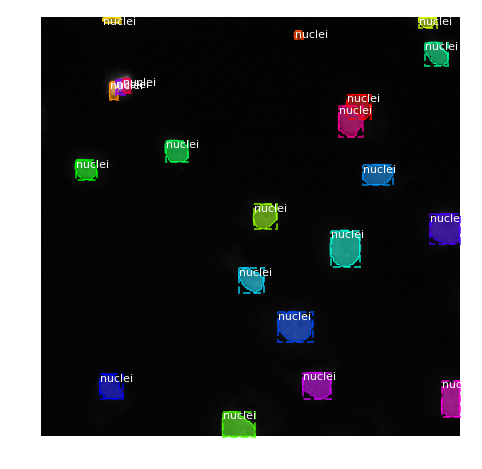

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  251.00000
molded_images            shape: (1, 512, 512, 3)      min:    1.00000  max:  251.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


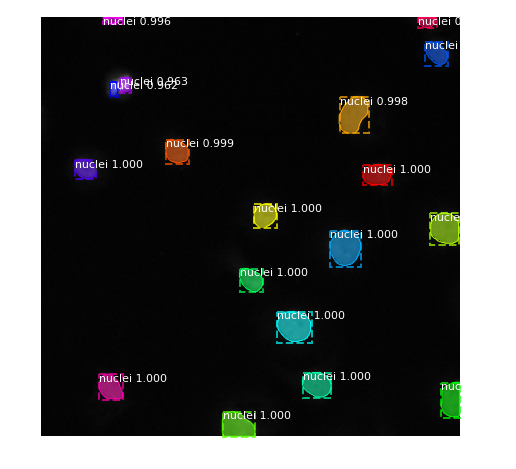

original_image           shape: (512, 512, 3)         min:    0.00000  max:  234.00000
image_meta               shape: (10,)                 min:    0.00000  max:  640.00000
gt_class_id              shape: (37,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (37, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 37)        min:    0.00000  max:    1.00000


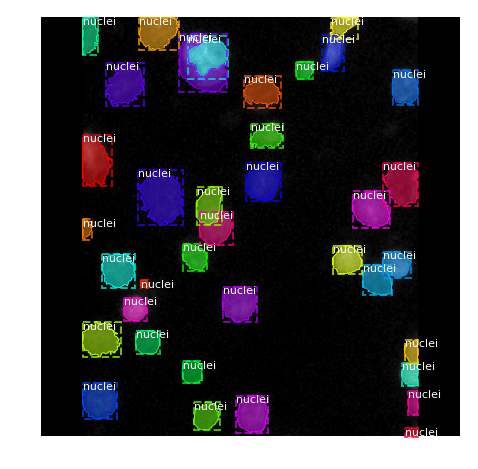

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  234.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  234.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


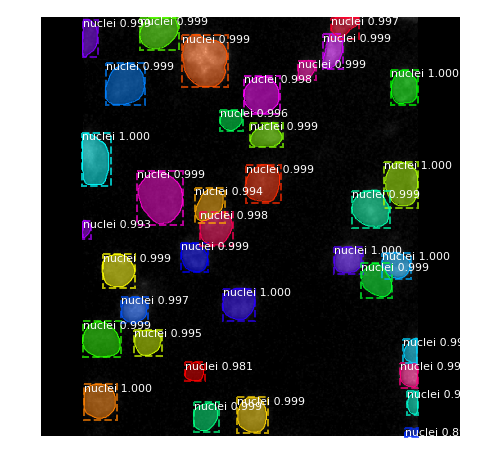

original_image           shape: (512, 512, 3)         min:    0.00000  max:  253.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (92,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (92, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 92)        min:    0.00000  max:    1.00000


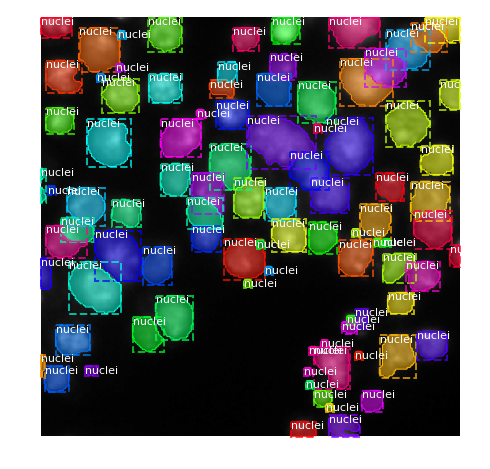

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  253.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  253.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


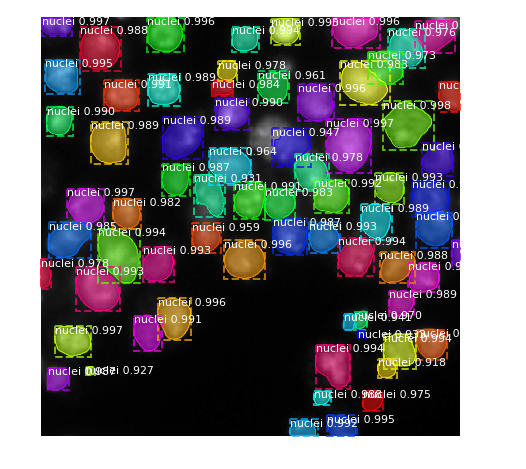

original_image           shape: (512, 512, 3)         min:    1.00000  max:  255.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (73,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (73, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 73)        min:    0.00000  max:    1.00000


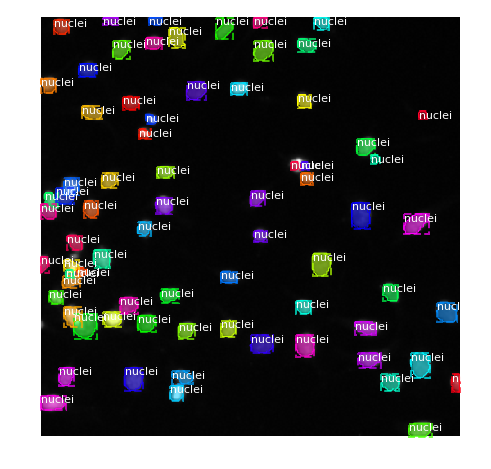

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    1.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


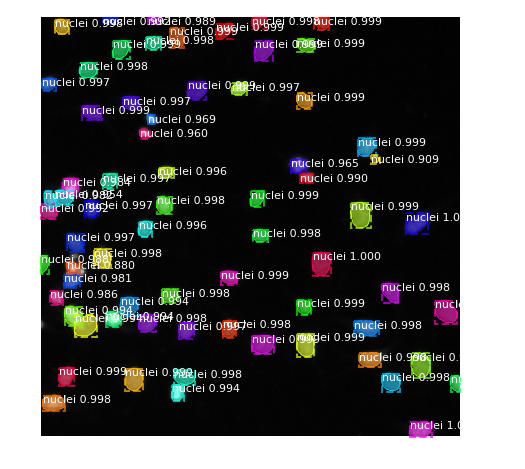

original_image           shape: (512, 512, 3)         min:    0.00000  max:  208.00000
image_meta               shape: (10,)                 min:    0.00000  max: 1272.00000
gt_class_id              shape: (199,)                min:    1.00000  max:    1.00000
gt_bbox                  shape: (199, 4)              min:   20.00000  max:  383.00000
gt_mask                  shape: (512, 512, 199)       min:    0.00000  max:    1.00000


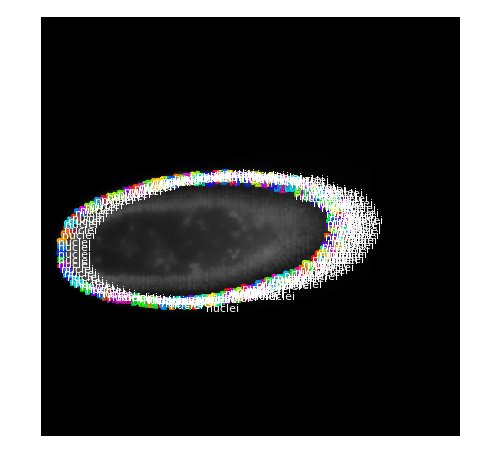

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  208.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  208.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


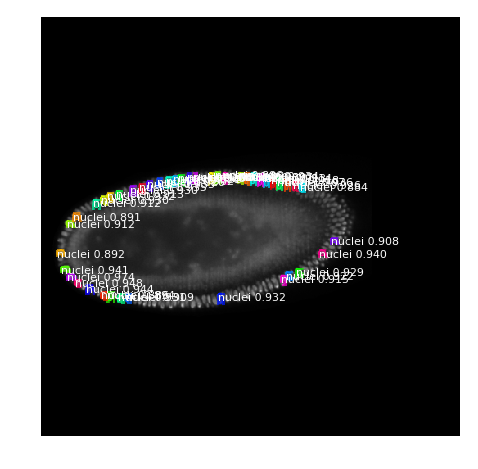

original_image           shape: (512, 512, 3)         min:    1.00000  max:  255.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (30,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (30, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 30)        min:    0.00000  max:    1.00000


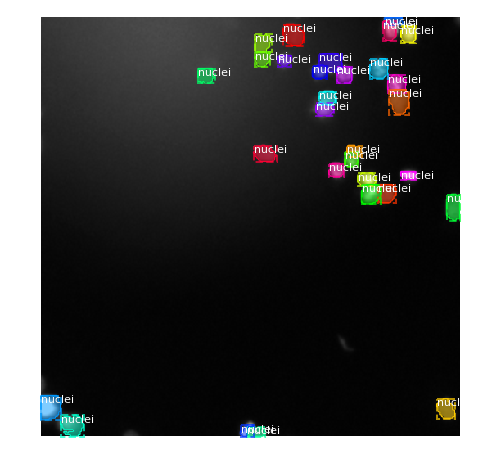

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    1.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


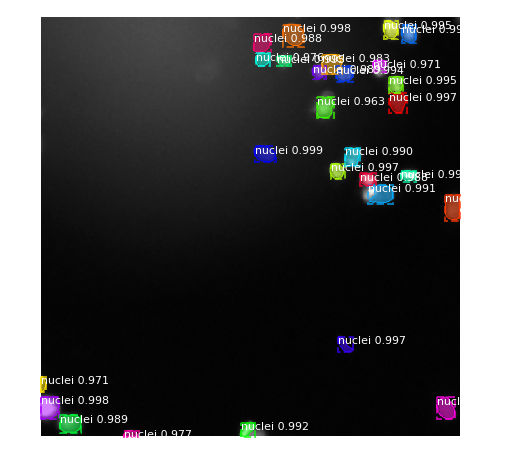

original_image           shape: (512, 512, 3)         min:    1.00000  max:  254.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (10,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (10, 4)               min:    0.00000  max:  502.00000
gt_mask                  shape: (512, 512, 10)        min:    0.00000  max:    1.00000


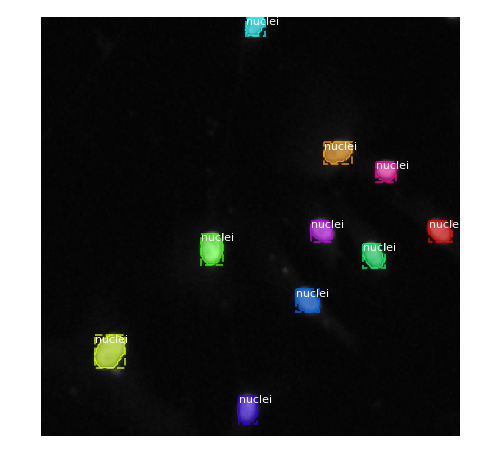

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  254.00000
molded_images            shape: (1, 512, 512, 3)      min:    1.00000  max:  254.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


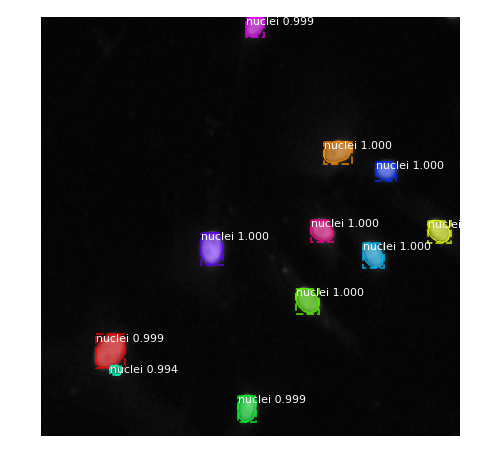

original_image           shape: (512, 512, 3)         min:    2.00000  max:  250.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (75,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (75, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 75)        min:    0.00000  max:    1.00000


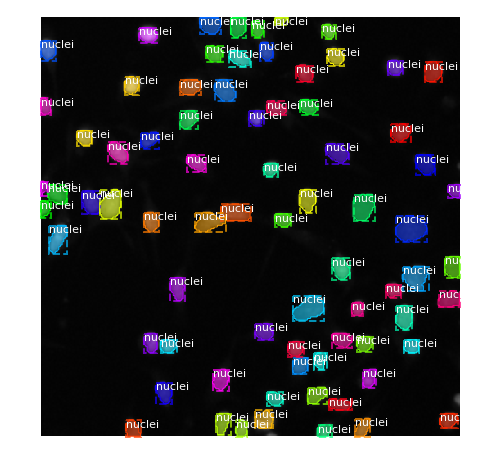

Processing 1 images
image                    shape: (512, 512, 3)         min:    2.00000  max:  250.00000
molded_images            shape: (1, 512, 512, 3)      min:    2.00000  max:  250.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


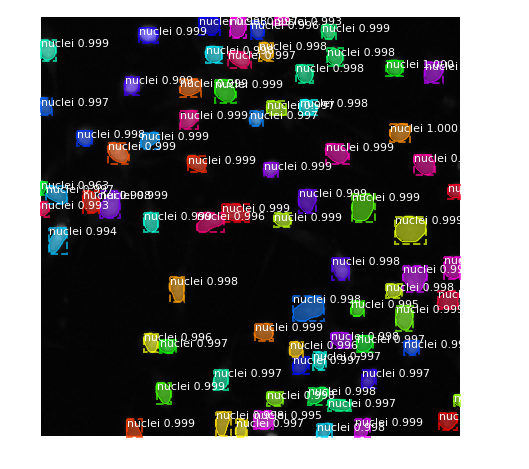

original_image           shape: (512, 512, 3)         min:    0.00000  max:  251.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (11,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (11, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 11)        min:    0.00000  max:    1.00000


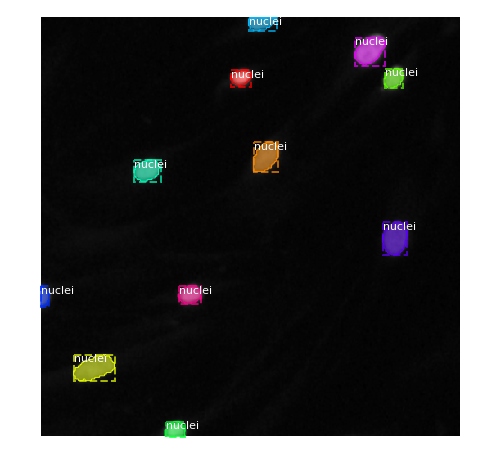

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  251.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  251.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


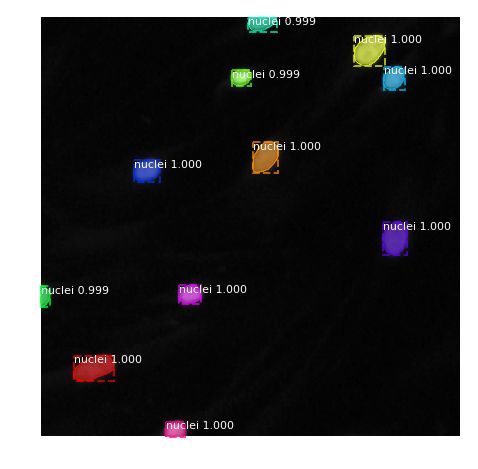

original_image           shape: (512, 512, 3)         min:    0.00000  max:  251.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (52,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (52, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 52)        min:    0.00000  max:    1.00000


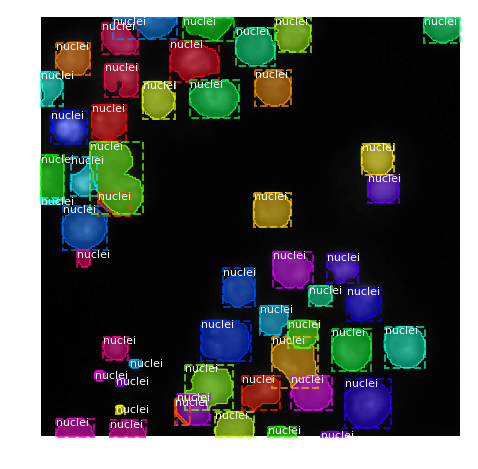

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  251.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  251.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


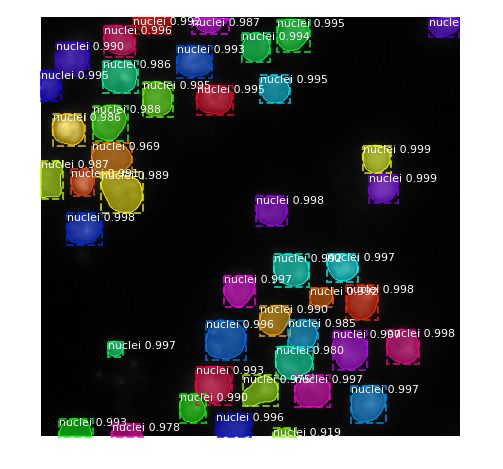

original_image           shape: (512, 512, 3)         min:    3.00000  max:  252.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (22,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (22, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 22)        min:    0.00000  max:    1.00000


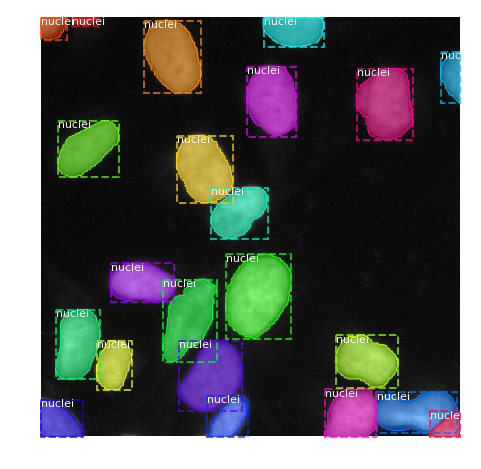

Processing 1 images
image                    shape: (512, 512, 3)         min:    3.00000  max:  252.00000
molded_images            shape: (1, 512, 512, 3)      min:    3.00000  max:  252.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


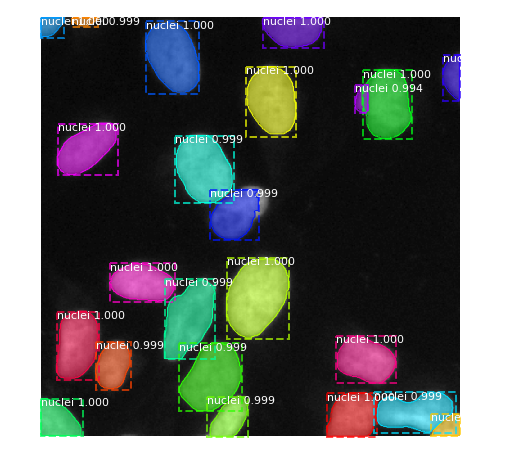

original_image           shape: (512, 512, 3)         min:    1.00000  max:  251.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (43,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (43, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 43)        min:    0.00000  max:    1.00000


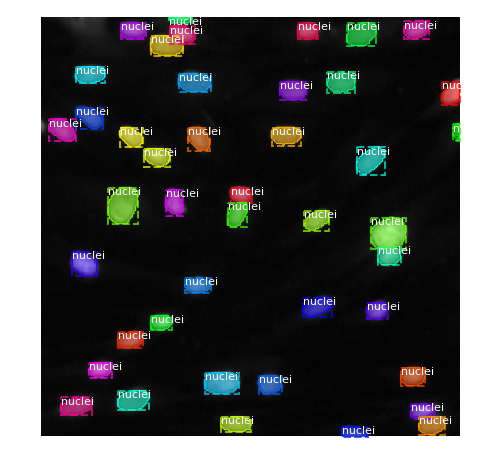

Processing 1 images
image                    shape: (512, 512, 3)         min:    1.00000  max:  251.00000
molded_images            shape: (1, 512, 512, 3)      min:    1.00000  max:  251.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


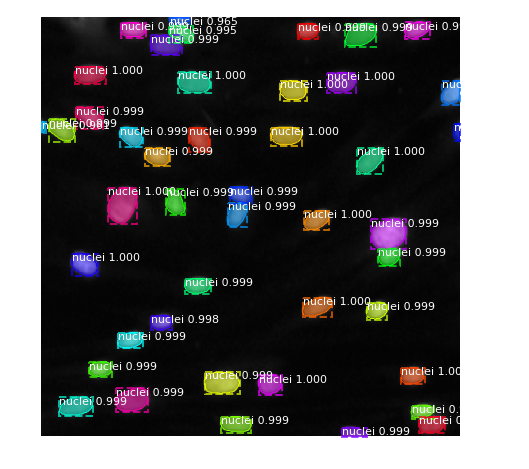

original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000
image_meta               shape: (10,)                 min:    0.00000  max:  696.00000
gt_class_id              shape: (25,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (25, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 25)        min:    0.00000  max:    1.00000


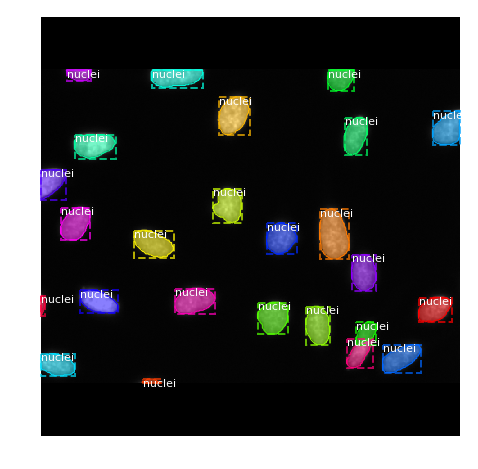

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  255.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


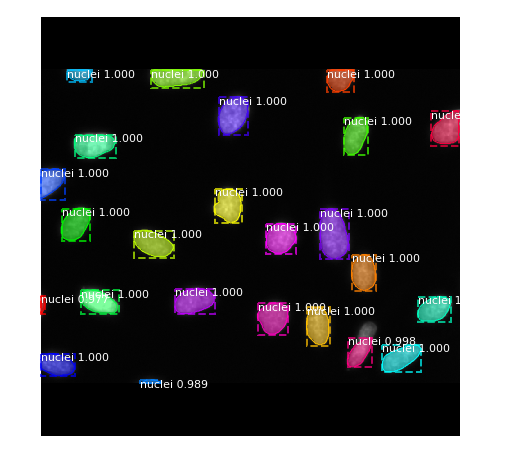

original_image           shape: (512, 512, 3)         min:    0.00000  max:  253.00000
image_meta               shape: (10,)                 min:    0.00000  max:  512.00000
gt_class_id              shape: (25,)                 min:    1.00000  max:    1.00000
gt_bbox                  shape: (25, 4)               min:    0.00000  max:  512.00000
gt_mask                  shape: (512, 512, 25)        min:    0.00000  max:    1.00000


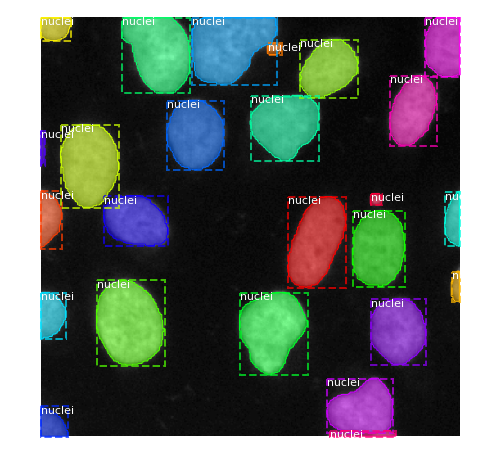

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  253.00000
molded_images            shape: (1, 512, 512, 3)      min:    0.00000  max:  253.00000
image_metas              shape: (1, 10)               min:    0.00000  max:  512.00000


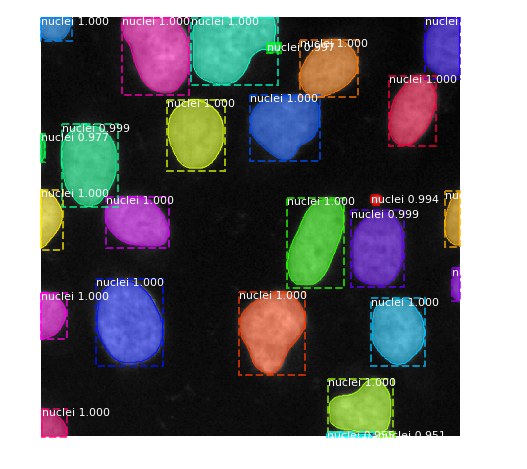

In [56]:
for i in range(2):
    val_index = 1-i
    dataset_train, dataset_val = datasets[val_index]
    
    model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)
    
    model_path = paths[val_index]
    print("Loading weights from ", model_path)
    model.load_weights(model_path, by_name=True)
    
    train_image_ids = np.random.choice(dataset_train.image_ids, 10)
    for image_id in train_image_ids:
        original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset_train, inference_config, 
                                   image_id, use_mini_mask=False)

        log("original_image", original_image)
        log("image_meta", image_meta)
        log("gt_class_id", gt_class_id)
        log("gt_bbox", gt_bbox)
        log("gt_mask", gt_mask)

        visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                                    dataset_train.class_names, figsize=(8, 8))

        results = model.detect([original_image], verbose=1)

        r = results[0]
        visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                    dataset_train.class_names, r['scores'], ax=get_ax())
    
    
    for image_id in dataset_val.image_ids:
        original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset_val, inference_config, 
                                   image_id, use_mini_mask=False)

        log("original_image", original_image)
        log("image_meta", image_meta)
        log("gt_class_id", gt_class_id)
        log("gt_bbox", gt_bbox)
        log("gt_mask", gt_mask)

        visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                                    dataset_val.class_names, figsize=(8, 8))

        results = model.detect([original_image], verbose=1)

        r = results[0]
        visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                    dataset_val.class_names, r['scores'], ax=get_ax())

# Create Submission
It is looking good on the validation.
Let's see how will it do on the public LB.

In [32]:
test_ids = os.listdir(test_dir)

In [33]:
def test_split(meta_test):
    meta_test_groups = [meta_test[meta_test['group'] == group].reset_index(drop=True) for group in range(2)]
    return meta_test_groups

In [34]:
meta_test_groups = test_split(meta_test)

In [35]:
test_datasets = []
for i in range(2):
    
    te = meta_test_groups[i]

    # Testing dataset
    dataset_test = DsbDataset()
    dataset_test.load_dataset(te[['ImageId', 'process_type']], train_mode=False)
    dataset_test.prepare()
    
    test_datasets.append(dataset_test)

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [36]:
inference_config.DETECTION_MIN_CONFIDENCE = 0.88
raw_predictions = []
image_ids = []

for i in range(2):
    test_index = 1-i
    dataset_test = test_datasets[test_index]
    
    model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)
    
    model_path = paths[test_index]
    print("Loading weights from ", model_path)
    model.load_weights(model_path, by_name=True)
    
    for x, test_id in enumerate(dataset_test.image_ids):
        test_image1 = dataset_test.load_image(test_id, 0)
        pred = model.detect([test_image1], verbose=0)
        pred = pred[0]

        visualize.display_instances(test_image1, pred['rois'], pred['masks'], pred['class_ids'], 
                                    dataset_test.class_names, pred['scores'], ax=get_ax())
        
        sc = pred['scores']
        pred = pred['masks']
        raw_predictions.append((pred, sc))
        image_ids.append(meta_test_groups[test_index].ImageId.values[x])
        print(meta_test_groups[test_index].bg_type.values[x])
        
predictions = pd.Series(index=image_ids, data=raw_predictions)
predictions = predictions.loc[test_ids].values

Loading weights from  logs/0331_color/mask_rcnn_dsb_0070.h5


UnknownError: NameError: name 'boxes' is not defined
	 [[Node: mrcnn_detection/map/while/test_cpu_soft_nms = PyFunc[Tin=[DT_FLOAT, DT_FLOAT, DT_INT32, DT_FLOAT, DT_FLOAT], Tout=[DT_INT32], token="pyfunc_0", _device="/job:localhost/replica:0/task:0/device:CPU:0"](mrcnn_detection/map/while/Exp/_4353, mrcnn_detection/map/while/Gather_1/_4355, mrcnn_detection/map/while/test_cpu_soft_nms/input_2, mrcnn_detection/map/while/test_cpu_soft_nms/input_3, mrcnn_detection/map/while/test_cpu_soft_nms/input_4)]]
	 [[Node: mrcnn_detection/Gather_5/_4279 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device_incarnation=1, tensor_name="edge_3679_mrcnn_detection/Gather_5", tensor_type=DT_INT64, _device="/job:localhost/replica:0/task:0/device:GPU:0"]()]]

Caused by op 'mrcnn_detection/map/while/test_cpu_soft_nms', defined at:
  File "/usr/lib/python3.5/runpy.py", line 184, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.5/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.5/dist-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelapp.py", line 478, in start
    self.io_loop.start()
  File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "/usr/local/lib/python3.5/dist-packages/tornado/ioloop.py", line 888, in start
    handler_func(fd_obj, events)
  File "/usr/local/lib/python3.5/dist-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/usr/local/lib/python3.5/dist-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelbase.py", line 233, in dispatch_shell
    handler(stream, idents, msg)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/zmqshell.py", line 537, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/usr/local/lib/python3.5/dist-packages/IPython/core/interactiveshell.py", line 2728, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/usr/local/lib/python3.5/dist-packages/IPython/core/interactiveshell.py", line 2850, in run_ast_nodes
    if self.run_code(code, result):
  File "/usr/local/lib/python3.5/dist-packages/IPython/core/interactiveshell.py", line 2910, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-36-a51f8a7c7420>", line 11, in <module>
    model_dir=MODEL_DIR)
  File "Mask_RCNN/model.py", line 1837, in __init__
    self.keras_model = self.build(mode=mode, config=config)
  File "Mask_RCNN/model.py", line 2025, in build
    [rpn_rois, mrcnn_class, mrcnn_bbox, input_image_meta])
  File "/usr/local/lib/python3.5/dist-packages/keras/engine/topology.py", line 619, in __call__
    output = self.call(inputs, **kwargs)
  File "Mask_RCNN/model.py", line 861, in call
    self.config.IMAGES_PER_GPU)
  File "Mask_RCNN/utils.py", line 721, in batch_slice
    output_slice = graph_fn(*inputs_slice)
  File "Mask_RCNN/model.py", line 860, in <lambda>
    lambda x, y, w, z: refine_detections_graph(x, y, w, z, self.config),
  File "Mask_RCNN/model.py", line 808, in refine_detections_graph
    dtype=tf.int64)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/functional_ops.py", line 389, in map_fn
    swap_memory=swap_memory)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/control_flow_ops.py", line 2816, in while_loop
    result = loop_context.BuildLoop(cond, body, loop_vars, shape_invariants)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/control_flow_ops.py", line 2640, in BuildLoop
    pred, body, original_loop_vars, loop_vars, shape_invariants)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/control_flow_ops.py", line 2590, in _BuildLoop
    body_result = body(*packed_vars_for_body)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/functional_ops.py", line 379, in compute
    packed_fn_values = fn(packed_values)
  File "Mask_RCNN/model.py", line 792, in nms_keep_map
    tf.int32, name='test_cpu_soft_nms')
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/script_ops.py", line 212, in py_func
    input=inp, token=token, Tout=Tout, name=name)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/ops/gen_script_ops.py", line 50, in _py_func
    "PyFunc", input=input, token=token, Tout=Tout, name=name)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/op_def_library.py", line 787, in _apply_op_helper
    op_def=op_def)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/ops.py", line 2956, in create_op
    op_def=op_def)
  File "/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/ops.py", line 1470, in __init__
    self._traceback = self._graph._extract_stack()  # pylint: disable=protected-access

UnknownError (see above for traceback): NameError: name 'boxes' is not defined
	 [[Node: mrcnn_detection/map/while/test_cpu_soft_nms = PyFunc[Tin=[DT_FLOAT, DT_FLOAT, DT_INT32, DT_FLOAT, DT_FLOAT], Tout=[DT_INT32], token="pyfunc_0", _device="/job:localhost/replica:0/task:0/device:CPU:0"](mrcnn_detection/map/while/Exp/_4353, mrcnn_detection/map/while/Gather_1/_4355, mrcnn_detection/map/while/test_cpu_soft_nms/input_2, mrcnn_detection/map/while/test_cpu_soft_nms/input_3, mrcnn_detection/map/while/test_cpu_soft_nms/input_4)]]
	 [[Node: mrcnn_detection/Gather_5/_4279 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device_incarnation=1, tensor_name="edge_3679_mrcnn_detection/Gather_5", tensor_type=DT_INT64, _device="/job:localhost/replica:0/task:0/device:GPU:0"]()]]


In [63]:
def rle_encoding(x):
    '''
    x: numpy array of shape (height, width), 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = np.where(x.T.flatten()==1)[0] # .T sets Fortran order down-then-right
    run_lengths = []
    prev = -2
    for b in dots:
        if (b>prev+1): run_lengths.extend((b+1, 0))
        run_lengths[-1] += 1
        prev = b
    return run_lengths

In [64]:
def numpy2encoding_no_overlap(predicts, img_name, scores):
    sum_predicts = np.sum(predicts, axis=2)
    rows, cols = np.where(sum_predicts>=2)
    
    for i in zip(rows, cols):
        instance_indicies = np.where(np.any(predicts[i[0],i[1],:]))[0]
        highest = instance_indicies[0]
        predicts[i[0],i[1],:] = predicts[i[0],i[1],:]*0
        predicts[i[0],i[1],highest] = 1
    
    ImageId = []
    EncodedPixels = []
    print(predicts.shape)
    for i in range(predicts.shape[2]): 
        rle = rle_encoding(predicts[:,:,i])
        if len(rle)>0:
            ImageId.append(img_name)
            EncodedPixels.append(rle)    
    return ImageId, EncodedPixels

In [65]:
new_test_ids = []
rles = []
for id, raw_pred in zip(test_ids, predictions):
    ids, rle = numpy2encoding_no_overlap(raw_pred[0], id, raw_pred[1])
    new_test_ids += ids
    rles += rle
    
print(len(predictions))

(256, 256, 6)
(512, 680, 23)
(390, 239, 63)
(260, 347, 115)
(512, 680, 19)
(524, 348, 113)
(260, 347, 88)
(519, 161, 34)
(256, 256, 11)
(512, 680, 13)
(512, 640, 4)
(256, 256, 10)
(512, 640, 5)
(256, 256, 45)
(256, 256, 7)
(524, 348, 87)
(519, 253, 55)
(256, 256, 54)
(256, 256, 77)
(256, 256, 14)
(256, 256, 7)
(512, 680, 35)
(520, 696, 27)
(256, 256, 35)
(519, 162, 45)
(524, 348, 133)
(520, 696, 26)
(520, 348, 174)
(256, 256, 28)
(256, 256, 10)
(512, 680, 66)
(256, 256, 7)
(512, 640, 24)
(260, 347, 117)
(512, 680, 29)
(512, 640, 20)
(519, 253, 56)
(256, 256, 43)
(256, 256, 4)
(520, 348, 176)
(520, 348, 196)
(520, 348, 202)
(512, 640, 17)
(256, 256, 6)
(524, 348, 82)
(512, 640, 3)
(512, 680, 50)
(520, 696, 24)
(512, 680, 57)
(256, 256, 13)
(256, 256, 9)
(519, 253, 55)
(256, 256, 17)
(519, 161, 47)
(256, 256, 30)
(519, 162, 43)
(256, 256, 10)
(519, 253, 61)
(512, 640, 20)
(256, 256, 9)
(260, 347, 110)
(520, 696, 31)
(256, 256, 10)
(512, 640, 20)
(256, 256, 86)
65


In [66]:
df = pd.DataFrame({ 'ImageId' : new_test_ids , 'EncodedPixels' : rles})
df.to_csv('output/submission_ci88_epoch_g_50_c_70.csv', index=False, columns=['ImageId', 'EncodedPixels'])

This should get you to around 0.44 on the LB. 

Tweak it and improve your score!